# Práctica 2: Eddies y ondas de Rossby

In [1]:
import numpy as np
import netCDF4 as nc
from scipy import stats
from scipy import signal
from scipy.fft import fft, ifft, fftfreq
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.stats.stats import pearsonr
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point
import numpy.ma as ma
import numpy.linalg as linalg
import time
import xarray as xr
from matplotlib import animation, rc
from IPython.display import HTML, Image

C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_18556\1969018373.py:8: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import pearsonr


En esta práctica mostraremos que los eddies transitorios y estacionarios juegan un papel importante para el transporte meridiano de calor por la circulación atmosférica. Además, analizaremos las características de la variabilidad eddy en capas altas extratropicales, asociada a ondas de Rossby. Para el informe de la práctica tenéis que responder a las preguntas de este guión. Además de las figuras pedidas, en el informe hay que discutir los resultados obtenidos tomando como orientación las preguntas planteadas.

### 1. Eddies estacionarios y transitorios

Mostrar mapas de contornos para el nivel de 300 hPa de las siguientes variables (en función de latitud y longitud, superponiendo los contornos geográficos): 
(a) la temperatura de un día cualquiera del periodo de estudio
(b) la temperatura media climatológica
(c) la componente eddy transitoria para el día elegido (anomalía temporal). 
(d) la componente eddy (anomalía zonal) para el día elegido
(e) la componente eddy de la temperatura media climatológica (componente eddy estacionaria)

##### ¿Qué tipo de estructuras se observan en cada caso? ¿Tienen las componentes eddy la misma escala espacial en un día cualquiera y en la media temporal? ¿Cuál es el origen de las componentes eddy transitoria y estacionaria? ¿Qué diferencias observas entre los hemisferios Norte y Sur?

En primer lugar abrimos los datos.

In [2]:
fname ='datos_DJF_19-20.nc'

Para poder leer el netcdf tienes usar nc.Dataset. El comando .variables sin argumento de entrada muestra los nombres y características de TODAS variables que tiene el fichero netcdf

In [3]:
file= xr.open_dataset(fname)
file

<xarray.Dataset>
Dimensions:  (lat: 73, level: 14, lon: 144, time: 90)
Coordinates:
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * level    (level) float32 1e+03 925.0 850.0 700.0 ... 150.0 100.0 70.0 50.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) datetime64[ns] 2019-12-01 2019-12-02 ... 2020-02-28
Data variables:
    t        (time, level, lat, lon) float32 ...
    v        (time, level, lat, lon) float32 ...
Attributes:
    Conventions:                COARDS
    title:                      mean daily NMC reanalysis (2014)
    description:                Data is from NMC initialized reanalysis\n(4x/...
    platform:                   Model
    dataset_title:              NCEP-NCAR Reanalysis 1
    References:                 http://www.psl.noaa.gov/data/gridded/data.nce...
    NCO:                        4.7.2
    history:                    Mon Feb 14 16:03:40 2022: ncea -F -d time,31,...
    history_of_appended_files:  Sun Jan 17 17:10:22 2021: Appended file tndjf...
    nco_openmp_thread_number:   1

Vemos cómo están organizados los datos: variables temperatura y viento meridional, con dimensiones (tiempo, nivel de presión, latitud, longitud). Extraemos las variables:

In [4]:
latitud= file.lat 
longitud= file.lon
file

<xarray.Dataset>
Dimensions:  (lat: 73, level: 14, lon: 144, time: 90)
Coordinates:
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * level    (level) float32 1e+03 925.0 850.0 700.0 ... 150.0 100.0 70.0 50.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) datetime64[ns] 2019-12-01 2019-12-02 ... 2020-02-28
Data variables:
    t        (time, level, lat, lon) float32 ...
    v        (time, level, lat, lon) float32 ...
Attributes:
    Conventions:                COARDS
    title:                      mean daily NMC reanalysis (2014)
    description:                Data is from NMC initialized reanalysis\n(4x/...
    platform:                   Model
    dataset_title:              NCEP-NCAR Reanalysis 1
    References:                 http://www.psl.noaa.gov/data/gridded/data.nce...
    NCO:                        4.7.2
    history:                    Mon Feb 14 16:03:40 2022: ncea -F -d time,31,...
    history_of_appended_files:  Sun Jan 17 17:10:22 2021: Appended file tndjf...
    nco_openmp_thread_number:   1

Para seleccionar el nivel de 300 hPa, vemos primero en qué posición está:

In [5]:
#seleccionamos el nivel 300
file_300= file.sel(level=300)
t_300= file_300.t
latitud= file_300.lat
longitud= file_300.lon
# Necesario para que pinte bien en lon=0
#v_300, longitud = add_cyclic_point(v_300, coord=longitud)

#cT, clon = add_cyclic_point(T, coord=lon)
dia= '2019-12-01'
file_300_dia= file_300.sel(time=dia)
file_300_dia

<xarray.Dataset>
Dimensions:  (lat: 73, lon: 144)
Coordinates:
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
    level    float32 300.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
    time     datetime64[ns] 2019-12-01
Data variables:
    t        (lat, lon) float32 ...
    v        (lat, lon) float32 ...
Attributes:
    Conventions:                COARDS
    title:                      mean daily NMC reanalysis (2014)
    description:                Data is from NMC initialized reanalysis\n(4x/...
    platform:                   Model
    dataset_title:              NCEP-NCAR Reanalysis 1
    References:                 http://www.psl.noaa.gov/data/gridded/data.nce...
    NCO:                        4.7.2
    history:                    Mon Feb 14 16:03:40 2022: ncea -F -d time,31,...
    history_of_appended_files:  Sun Jan 17 17:10:22 2021: Appended file tndjf...
    nco_openmp_thread_number:   1

(a) Representamos el mapa de temperatura para un día cualquiera 

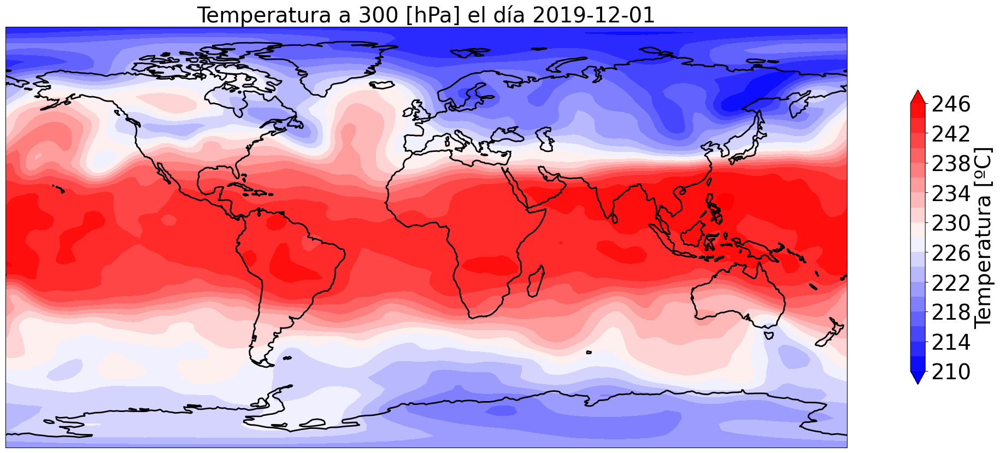

In [6]:
def dibujo_1_mapa_cartopy(A,lon,lat,levs,cmap1,l1,titulo, ax):
    im=ax.contourf(lon,lat,A
                   ,cmap=cmap1,levels=levs,extend='both',transform=ccrs.PlateCarree())
    ax.coastlines(linewidth=2);
    ax.set_title(titulo,fontsize=28)
    cbar = plt.colorbar(im, extend='neither', spacing='proportional',
                orientation='vertical', shrink=0.7, format="%2.0f")
    cbar.set_label(l1, size=28)
    cbar.ax.tick_params(labelsize=28) 

fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))

t_300_dia, longitud = add_cyclic_point(file_300_dia.t, coord=file_300.lon)
levels_temp= np.round(np.arange(t_300_dia.min(), t_300_dia.max(), 2),decimals=0)
dibujo_1_mapa_cartopy(t_300_dia,longitud,latitud,levels_temp, 'bwr','Temperatura [ºC]', 'Temperatura a 300 [hPa] el día '+str(dia),ax)

In [7]:
def animate(i):
    global im #, im2
    for c in im.collections:
        c.remove()  # removes only the contours, leaves the rest intact
    #for c in im2.collections:
    #    c.remove()  # removes only the contours, leaves the rest intact
    im = ax.contourf(lon,lat,var.sel(time=var.time[i+1]),levels, cmap = mapbar)
    #im2=ax.contour(lon,lat,var.sel(time=var.time[i+1]),im.levels, colors='gray')
    date_time = var.time[i+1].dt.strftime("%d/%m/%Y, %H UTC")
    sdate = str(np.array(date_time))

    ax.set_title('Fecha:'+ sdate,size=20)

rc('animation', html='html5')
frame = 50*4

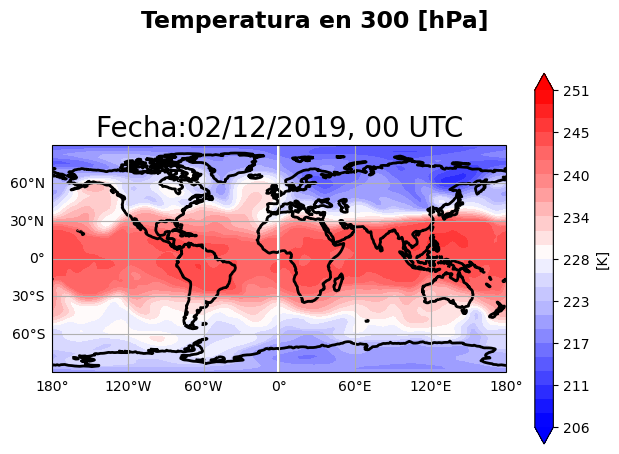

In [8]:
# Set up figure & axis for animation
fig, ax = plt.subplots(facecolor='w',tight_layout=True)
ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())

var = file_300.t #.metpy.dequantify() # Para poder usar el DataArray como un array normal debemos perder las unidades
lat= file_300.lat 
lon= file_300.lon
step = 4
cmin=np.min(var)
cmax=np.max(var)+1
levels= np.round(np.linspace(cmin,cmax,25),decimals=0)
mapbar= 'bwr'
titulo='Temperatura en 300 [hPa]'
unidades='[K]'
figura='300_temp.png'

# set up lines and points
im = ax.contourf(lon,lat,var.sel(time=var.time[0]),levels, cmap = mapbar,extend='both')
#im2=ax.contour(lon,lat,var.sel(time=var.time[0]),im.levels, colors='gray')
ax.coastlines(linewidth = 2)
gl=ax.gridlines(draw_labels = True)
gl.right_labels = False
gl.top_labels = False
fig.colorbar(im,ax=ax,orientation = 'vertical',shrink=0.9, label = unidades)
date_time = var.time[0].dt.strftime("%m/%d/%Y, %H UTC")
sdate = str(np.array(date_time))
fig.suptitle(titulo,size=17,weight='bold')
ax.set_title('Fecha: '+ sdate,size=15)
plt.tight_layout()

N = var.time.size

# run the simulation and animate it 

anim = animation.FuncAnimation(fig, animate, frames=N-1, interval=frame, blit=False,repeat=True)
#HTML(anim.to_html5_video())
anim.save('temp_300.gif')
anim

(b) Representamos la temperatura media

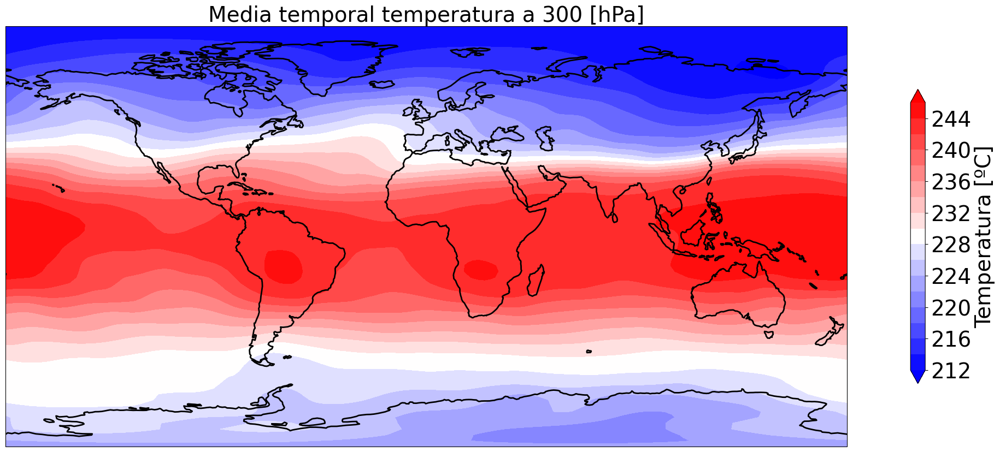

In [9]:
# Calculo la media de todos los tiempos
# Represento el mapa
temp_300_mean= file_300.t.mean(dim='time')
fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
temp_300_mean, longitud = add_cyclic_point(temp_300_mean, coord=file_300.lon)
levels_temp= np.round(np.arange(temp_300_mean.min(), temp_300_mean.max(), 2),decimals=0)
dibujo_1_mapa_cartopy(temp_300_mean,longitud,latitud,levels_temp, 'bwr','Temperatura [ºC]', 'Media temporal temperatura a 300 [hPa]',ax)

(c) Representamos la anomalía temporal (eddy transitorio)

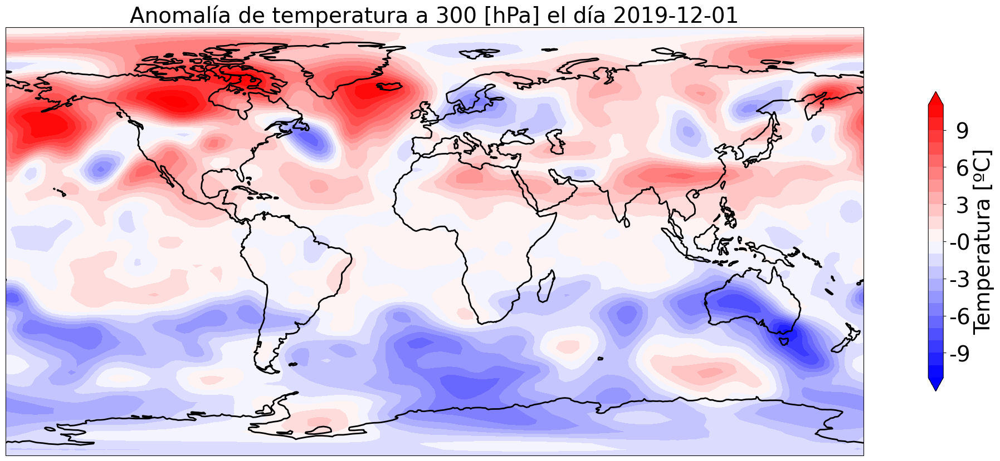

In [10]:
# Calculo la anomalía temporal
#Represento el mapa

fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
temp_anom_dia= t_300_dia-temp_300_mean
rango= np.max((np.abs(temp_anom_dia.min()),np.abs(temp_anom_dia.max())))
levels_temp= np.round(np.arange(-rango, +rango, 1),decimals=0)
dibujo_1_mapa_cartopy(temp_anom_dia,longitud,latitud,levels_temp, 'bwr','Temperatura [ºC]', 'Anomalía de temperatura a 300 [hPa] el día '+str(dia),ax)

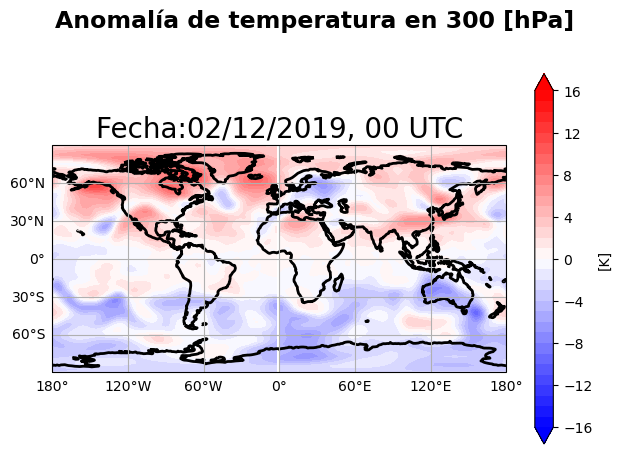

In [11]:
# Set up figure & axis for animation
fig, ax = plt.subplots(facecolor='w',tight_layout=True)
ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())

var = file_300.t-file_300.t.mean(dim='time') #.metpy.dequantify() # Para poder usar el DataArray como un array normal debemos perder las unidades
lat= file_300.lat 
lon= file_300.lon
step = 4
cmin=np.min(var)
cmax=np.max(var)
rango= np.max((np.abs(cmin),np.abs(cmax)))
levels= np.round(np.arange(-rango,+rango,1),decimals=0)
mapbar= 'bwr'
titulo='Anomalía de temperatura en 300 [hPa]'
unidades='[K]'
figura='300_temp_anomaly.png'

# set up lines and points
im = ax.contourf(lon,lat,var.sel(time=var.time[0]),levels, cmap = mapbar,extend='both')
#im2=ax.contour(lon,lat,var.sel(time=var.time[0]),im.levels, colors='gray')
ax.coastlines(linewidth = 2)
gl=ax.gridlines(draw_labels = True)
gl.right_labels = False
gl.top_labels = False
fig.colorbar(im,ax=ax,orientation = 'vertical',shrink=0.9, label = unidades)
date_time = var.time[0].dt.strftime("%m/%d/%Y, %H UTC")
sdate = str(np.array(date_time))
fig.suptitle(titulo,size=17,weight='bold')
ax.set_title('Fecha: '+ sdate,size=15)
plt.tight_layout()

N = var.time.size

# run the simulation and animate it 

anim = animation.FuncAnimation(fig, animate, frames=N-1, interval=frame, blit=False, repeat=True)
#HTML(anim.to_html5_video())
anim.save('temp_300_anomaly.gif')
anim

(d) la componente eddy (anomalía zonal) para el día elegido

In [18]:
#Calculo la media zonal y se la resto al campo total
#Tzm = np.expand_dims(Tzm, axis=-1) # Add an extra dimension in the last axis.
# Represento la figura
media_zonal= file_300.t.mean(dim='lon')
anomalia_zonal= file_300.t-media_zonal
anomalia_zonal_dia= anomalia_zonal.sel(time=dia)
anomalia_zonal_dia, longitud = add_cyclic_point(anomalia_zonal_dia, coord=file_300.lon)

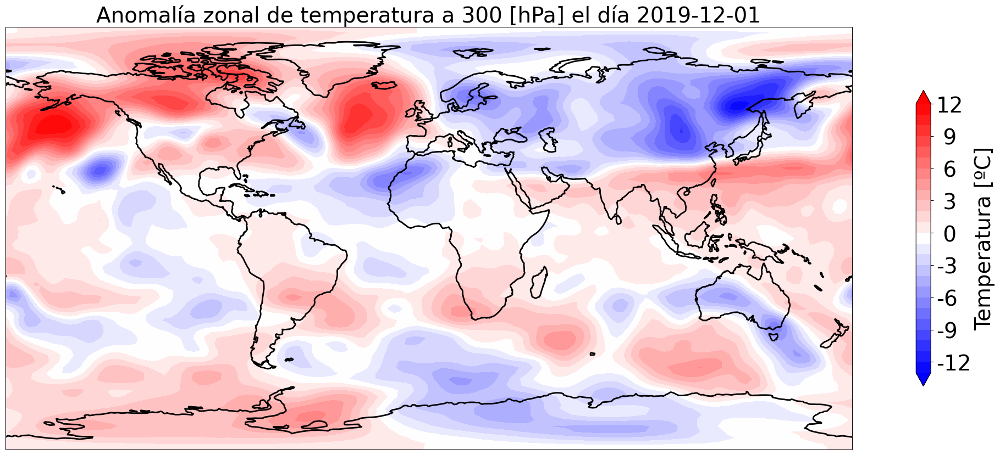

In [13]:
fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
rango= np.max((np.abs(anomalia_zonal_dia.min()),np.abs(anomalia_zonal_dia.max())))
levels_temp= np.round(np.arange(-rango, +rango, 1),decimals=0)
dibujo_1_mapa_cartopy(anomalia_zonal_dia,longitud,latitud,levels_temp, 'bwr','Temperatura [ºC]', 'Anomalía zonal de temperatura a 300 [hPa] el día '+str(dia),ax)

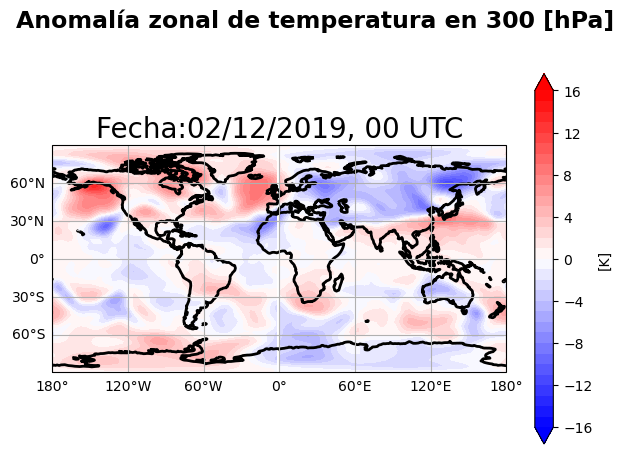

In [14]:
# Set up figure & axis for animation
fig, ax = plt.subplots(facecolor='w',tight_layout=True)
ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())

var = anomalia_zonal #.metpy.dequantify() # Para poder usar el DataArray como un array normal debemos perder las unidades
lat= file_300.lat 
lon= file_300.lon
step = 4
cmin=np.min(var)
cmax=np.max(var)
rango= np.max((np.abs(cmin),np.abs(cmax)))
levels= np.round(np.arange(-rango,+rango,1),decimals=0)
mapbar= 'bwr'
titulo='Anomalía zonal de temperatura en 300 [hPa]'
unidades='[K]'
figura='300_temp_zonal_anomaly.png'

# set up lines and points
im = ax.contourf(lon,lat,var.sel(time=var.time[0]),levels, cmap = mapbar,extend='both')
#im2=ax.contour(lon,lat,var.sel(time=var.time[0]),im.levels, colors='gray')
ax.coastlines(linewidth = 2)
gl=ax.gridlines(draw_labels = True)
gl.right_labels = False
gl.top_labels = False
fig.colorbar(im,ax=ax,orientation = 'vertical',shrink=0.9, label = unidades)
date_time = var.time[0].dt.strftime("%m/%d/%Y, %H UTC")
sdate = str(np.array(date_time))
fig.suptitle(titulo,size=17,weight='bold')
ax.set_title('Fecha: '+ sdate,size=15)
plt.tight_layout()

N = var.time.size

# run the simulation and animate it 

anim = animation.FuncAnimation(fig, animate, frames=N-1, interval=frame, blit=False,repeat=True)
#HTML(anim.to_html5_video())
anim.save('temp_300_zonal_anomaly.gif')
anim

(e) la componente eddy de la temperatura media climatológica (componente eddy estacionaria)

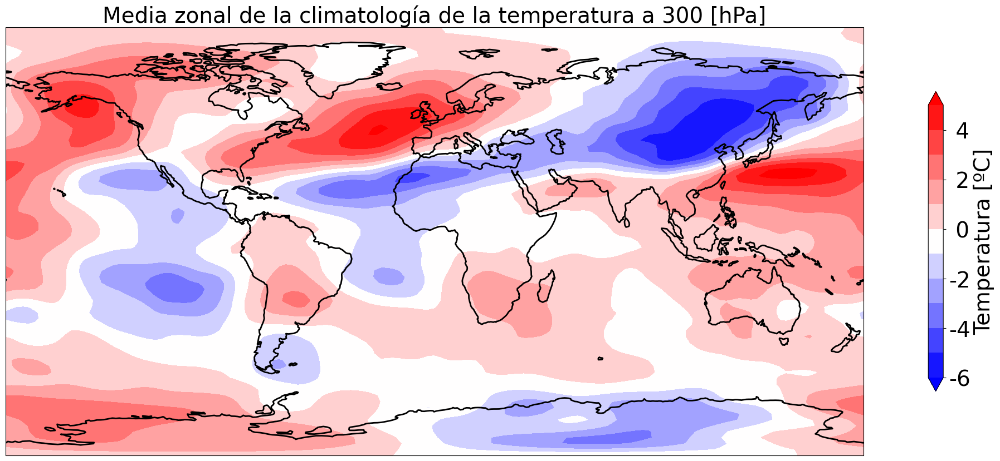

In [19]:
# Calculo la media zonal de la climatología
# Represento la figura
media_zonal_climatologia= anomalia_zonal.mean(dim='time')
media_zonal_climatologia, longitud = add_cyclic_point(media_zonal_climatologia, coord=file_300.lon)

fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
rango= np.max((np.abs(media_zonal_climatologia.min()),np.abs(media_zonal_climatologia.max())))
levels_temp= np.round(np.arange(-rango, +rango, 1),decimals=0)
dibujo_1_mapa_cartopy(media_zonal_climatologia,longitud,latitud,levels_temp, 'bwr','Temperatura [ºC]', 'Media zonal de la climatología de la temperatura a 300 [hPa]',ax)

#### 2. Flujos de calor

Los eddies tanto transitorios como estacionarios producen un transporte de calor y momento. 

(a) Para el mismo día elegido en el apartado 1, dibuja el mapa de la componente eddy de la velocidad meridiana a 300 hPa y compárala con la componente eddy (zonal y temporal) de la temperatura. 
##### ¿Observas alguna relación entre los signos de v y de T?¿Cuáles son las implicaciones? 

(b) Dibuja el flujo eddy meridiano transitorio y estacionario de calor durante el invierno extendido de 2019-20 en función de latitud y altura. 
##### ¿Qué dirección tiene el transporte? ¿En qué latitudes es este transporte mayor? ¿Son los flujos eddy igualmente importantes en ambos hemisferios?

(a) Representamos los eddies zonal y temporal de v y los comparamos con los de T

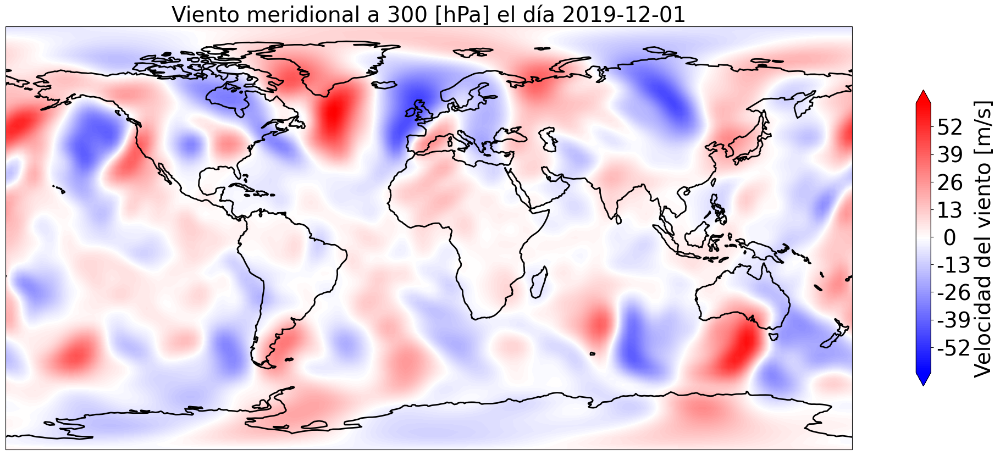

In [20]:
fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))

v_300_dia, longitud = add_cyclic_point(file_300_dia.v, coord=file_300.lon)
rango= np.max((np.abs(v_300_dia.min()),np.abs(v_300_dia.max())))
levels_wind= np.round(np.arange(-rango, +rango, 1),decimals=0)
dibujo_1_mapa_cartopy(v_300_dia,longitud,latitud,levels_wind, 'bwr','Velocidad del viento [m/s]', 'Viento meridional a 300 [hPa] el día '+str(dia),ax)

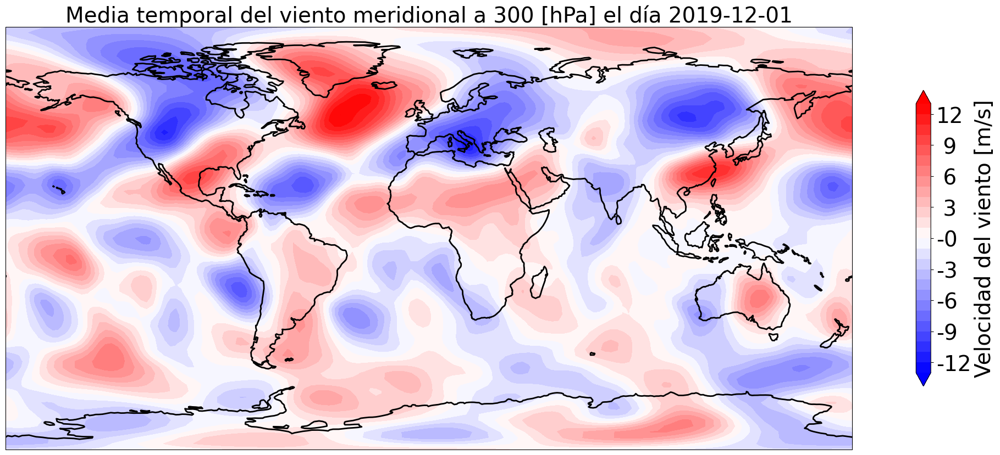

In [21]:
#ahora calculamos la media temporal
media_temporal_v= file_300.v.mean(dim='time')
fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))

media_temporal_v, longitud = add_cyclic_point(media_temporal_v, coord=file_300.lon)
rango= np.max((np.abs(media_temporal_v.min()),np.abs(media_temporal_v.max())))
levels_wind= np.round(np.arange(-rango, +rango, 1),decimals=0)
dibujo_1_mapa_cartopy(media_temporal_v,longitud,latitud,levels_wind, 'bwr','Velocidad del viento [m/s]', 'Media temporal del viento meridional a 300 [hPa] el día '+str(dia),ax)

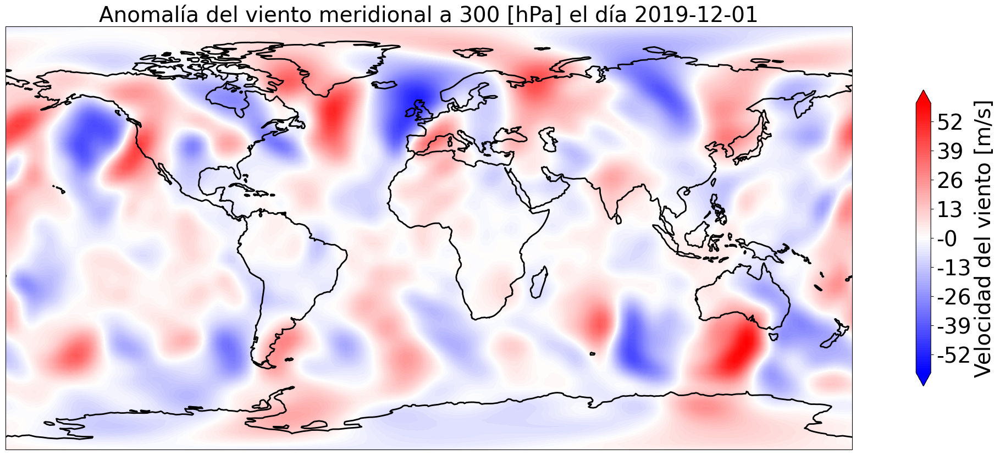

In [22]:
#ahora calculamos la anomalía temporal para el día
anomalia_temporal_v= file_300.v-file_300.v.mean(dim='time')
anomalia_zonal_dia_v= anomalia_temporal_v.sel(time=dia)
#anomalia_zonal_dia_v, longitud = add_cyclic_point(anomalia_zonal_dia_v, coord=file_300.lon)

fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))

anomalia_zonal_dia_v, longitud = add_cyclic_point(anomalia_zonal_dia_v, coord=file_300.lon)
rango= np.max((np.abs(anomalia_zonal_dia_v.min()),np.abs(anomalia_zonal_dia_v.max())))
levels_wind= np.round(np.arange(-rango, +rango, 1),decimals=0)
dibujo_1_mapa_cartopy(anomalia_zonal_dia_v,longitud,latitud,levels_wind, 'bwr','Velocidad del viento [m/s]', 'Anomalía del viento meridional a 300 [hPa] el día '+str(dia),ax)

*relacionar los signos de las anomalías de temperatura y de velocidad del viento, y relacionarlo con el flujo de calor en cada uno de los hemisferios
*lo que vemos es razonable, es invierno del hemisferio norte y tenemos mucha mayor actividad eddy en el HN

(b) Dibuja el flujo eddy meridiano transitorio y estacionario de calor durante el invierno extendido de 2019-20 en función de latitud y altura. 

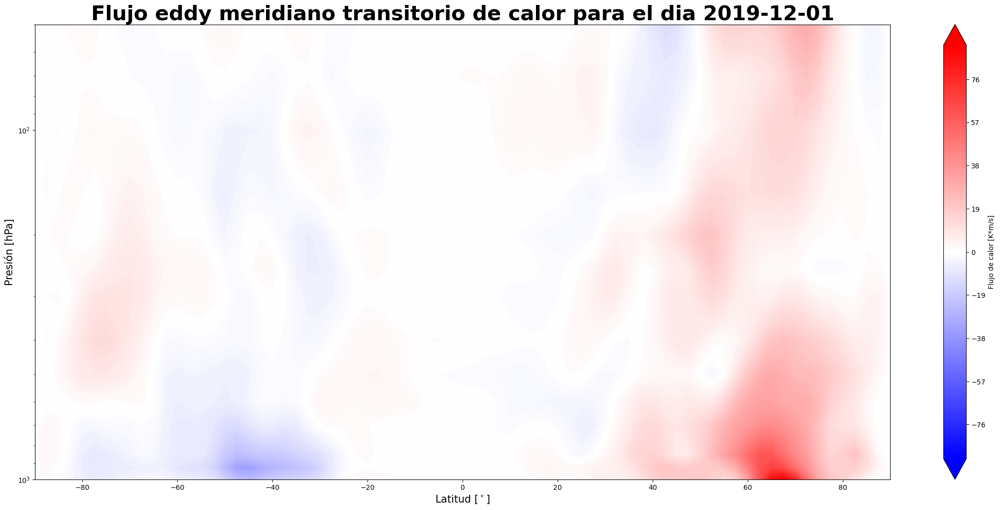

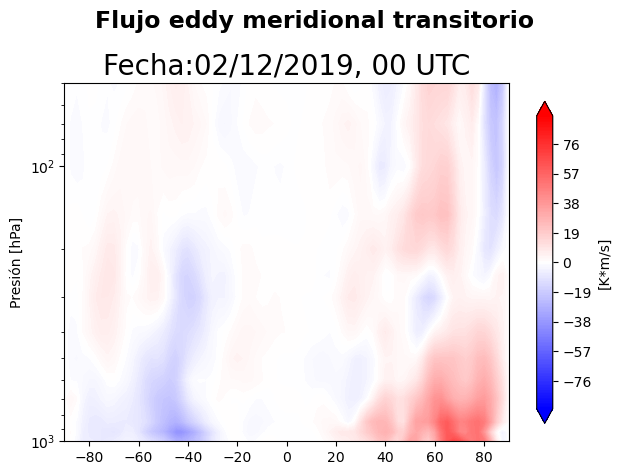

In [23]:
#calculamos el flujo eddy usando las anomalías de v y de t
anomalia_temporal_t = file.t-file.t.mean(dim='time')
flujo_eddy= anomalia_temporal_v*anomalia_temporal_t

#ahora promediamos en longitud y tiempo
flujo_eddy_temporal= flujo_eddy.mean(dim='time')
flujo_eddy_temporal_zonal= flujo_eddy_temporal.mean(dim='lon')
flujo_eddy_zonal_dia= flujo_eddy.mean(dim='lon').sel(time=dia)

#representamos en escala logarítmica el flujo eddy meridiano transitorio y el estacionario
fig = plt.figure(figsize=(28,12)) 
ax = fig.add_subplot(1, 1, 1)
rango= np.max((np.abs(flujo_eddy_zonal_dia.min()),np.abs(flujo_eddy_zonal_dia.max())))
levels_eddy= np.round(np.arange(-rango, +rango, 1),decimals=0)
im = ax.contourf(flujo_eddy_zonal_dia.lat,flujo_eddy_zonal_dia.level,np.transpose(np.array(flujo_eddy_zonal_dia)),levels_eddy,cmap='bwr',extend='both')
ax.set_yscale('log')
ax.invert_yaxis()
fig.colorbar(im,ax=ax, label='Flujo de calor [K*m/s]') #Para la barra de colores
#ii = ax.contour(latT,lev/100,mediaTpast)
ax.set_xlabel('Latitud [$^\circ$]',fontsize=15)
ax.set_ylabel('Presión [hPa]',fontsize=15)
ax.set_title('Flujo eddy meridiano transitorio de calor para el dia '+str(dia),fontsize=30,weight='bold')
#fig.savefig('Cambios temperatura del aire (Ta) del modelo CESM2-WACCM.png')

def animate2(i):
    global im #, im2
    for c in im.collections:
        c.remove()  # removes only the contours, leaves the rest intact
    #for c in im2.collections:
    #    c.remove()  # removes only the contours, leaves the rest intact
    im = ax.contourf(flujo_eddy_zonal_dia.lat,flujo_eddy_zonal_dia.level,var.sel(time=var.time[i+1]),levels,cmap=mapbar)
    #im2=ax.contour(lon,lat,var.sel(time=var.time[i+1]),im.levels, colors='gray')
    date_time = var.time[i+1].dt.strftime("%d/%m/%Y, %H UTC")
    sdate = str(np.array(date_time))
    ax.set_ylabel('Presión [hPa]')
    ax.set_title('Fecha:'+ sdate,size=20)

# Set up figure & axis for animation
fig, ax = plt.subplots(facecolor='w',tight_layout=True)
ax=plt.subplot(1,1,1)

var = flujo_eddy.mean(dim='lon').transpose() #.metpy.dequantify() # Para poder usar el DataArray como un array normal debemos perder las unidades
cmin=np.min(var)
cmax=np.max(var)
rango= np.max((np.abs(cmin),np.abs(cmax)))
levels= np.round(np.arange(-rango,+rango,1),decimals=0)
mapbar= 'bwr'
titulo='Flujo eddy meridional transitorio'
unidades='[K*m/s]'
figura='flujo_eddy.png'

# set up lines and points
im = ax.contourf(flujo_eddy_zonal_dia.lat,flujo_eddy_zonal_dia.level,var.sel(time=var.time[0]),levels,cmap='bwr',extend='both')
ax.set_yscale('log')
ax.invert_yaxis()

fig.colorbar(im,ax=ax,orientation = 'vertical',shrink=0.9, label = unidades)
date_time = var.time[0].dt.strftime("%m/%d/%Y, %H UTC")
sdate = str(np.array(date_time))
fig.suptitle(titulo,size=17,weight='bold')
ax.set_title('Fecha: '+ sdate,size=15)
plt.tight_layout()

N = var.time.size

# run the simulation and animate it 

anim = animation.FuncAnimation(fig, animate2, frames=N-1, interval=frame, blit=False,repeat=True)
#HTML(anim.to_html5_video())
anim.save('flujo_eddy_zonal_anomaly.gif')
anim

Text(0.5, 1.0, 'Flujo eddy meridiano estacionario de calor')

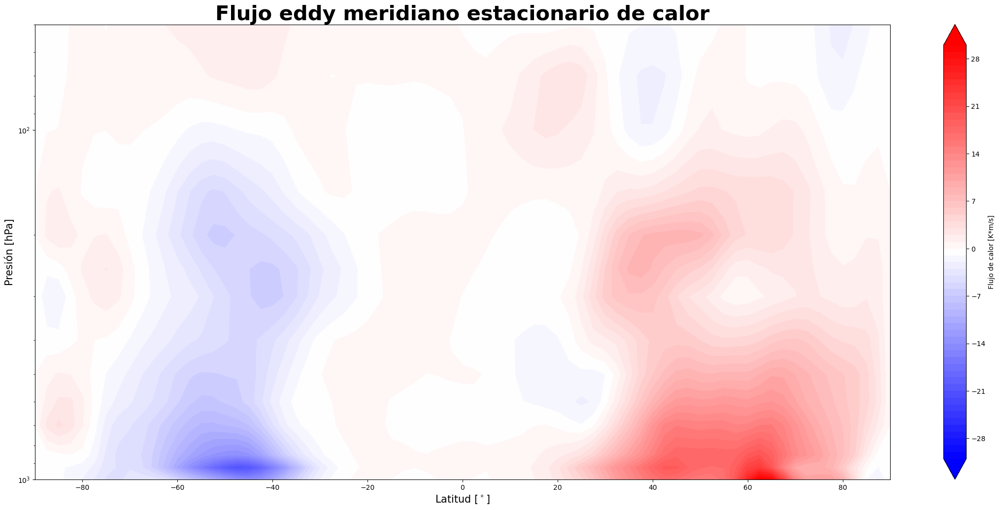

In [24]:
fig = plt.figure(figsize=(28,12)) 
ax = fig.add_subplot(1, 1, 1)
rango= np.max((np.abs(flujo_eddy_temporal_zonal.min()),np.abs(flujo_eddy_temporal_zonal.max())))
levels_eddy= np.round(np.arange(-rango, +rango, 1),decimals=0)
im = ax.contourf(flujo_eddy_temporal_zonal.lat,flujo_eddy_temporal_zonal.level,np.transpose(np.array(flujo_eddy_temporal_zonal)),levels_eddy,cmap='bwr',extend='both')
ax.set_yscale('log')
ax.invert_yaxis()
fig.colorbar(im,ax=ax, label='Flujo de calor [K*m/s]') #Para la barra de colores
#ii = ax.contour(latT,lev/100,mediaTpast)
ax.set_xlabel('Latitud [$^\circ$]',fontsize=15)
ax.set_ylabel('Presión [hPa]',fontsize=15)
ax.set_title('Flujo eddy meridiano estacionario de calor',fontsize=30,weight='bold')
#fig.savefig('Cambios temperatura del aire (Ta) del modelo CESM2-WACCM.png')


#### 3. Propagación de ondas de Rossby

Representa: (a) el diagrama de Hovmoeller de la componente eddy transitoria de la velocidad meridiana a la latitud 50⁰S y a 300 hPa; (b) el diagrama de Hovmoeller del paquete de ondas del mismo campo. Considerar que la onda portadora tiene números de onda típicamente entre 4 y 9.

##### Compara la información de los diagramas de Hovmoeller para las anomalías y las envolventes: ¿te parecen consistentes entre sí? Describe cómo puede usarse la información mostrada para estudiar la propagación de ondas, usando como ejemplo alguna anomalía concreta. A partir de algún ejemplo representativo de evolución de fases individuales y de paquetes de ondas, traza líneas rectas siguiendo su evolución espacio temporal y estima las velocidades de fase y de grupo a partir de la pendiente de dichas líneas. ¿Cuál es mayor? 

(c) Construye diagramas de Hovmoeller análogos a los del ejercicio anterior para el Hemisferio Norte (latitud 45ºN y 300 hPa). 

##### ¿A qué se deben las diferencias entre los dos hemisferios? 

(d) Dibuja la media climatológica de la envolvente del paquete de ondas de la componente transitoria de la velocidad meridiana en función de longitud y latitud a 300 hPa, superponiendo el mapa de costas. 

##### ¿Observas diferencias entre unas longitudes y otras? ¿En qué regiones son más débiles y más intensos los eddies transitorios?

(a) El Hovmoeller es la representación de v' en función de longitud y tiempo

Text(0.5, 1.0, 'Diagrama de Hovmöller de la componente eddy transitoria a 300 [hPa] y a 50$^\\circ$S')

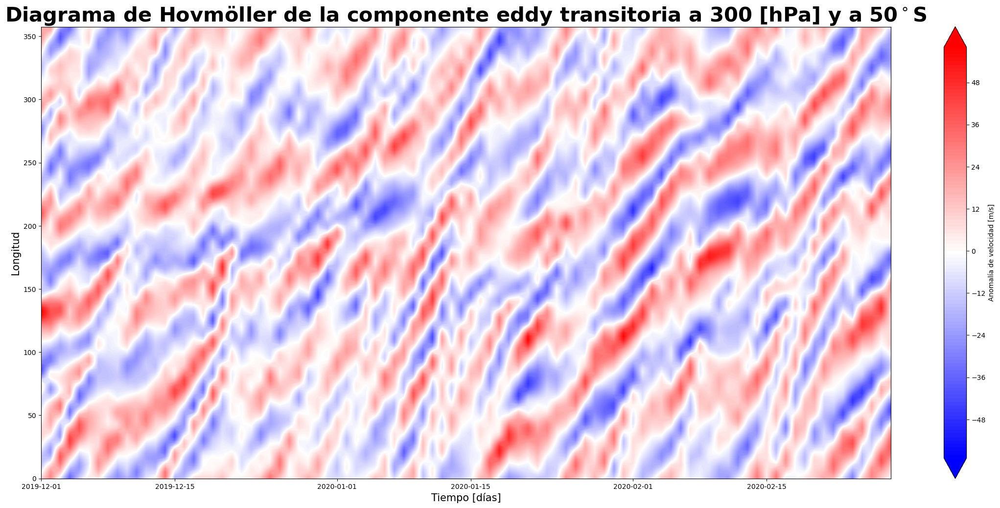

In [31]:
anomalia_temporal_v_50S= anomalia_temporal_v.sel(lat=-50)
fig = plt.figure(figsize=(28,12)) 
ax = fig.add_subplot(1, 1, 1)
rango= np.max((np.abs(anomalia_temporal_v_50S.min()),np.abs(anomalia_temporal_v_50S.max())))
levels_hoevmoller= np.round(np.arange(-rango, +rango, 1),decimals=0)
im = ax.contourf(anomalia_temporal_v_50S.time,anomalia_temporal_v_50S.lon,np.transpose(np.array(anomalia_temporal_v_50S)),levels_hoevmoller,cmap='bwr',extend='both')
fig.colorbar(im,ax=ax, label='Anomalía de velocidad [m/s]') #Para la barra de colores
#ii = ax.contour(latT,lev/100,mediaTpast)
ax.set_xlabel('Tiempo [días]',fontsize=15)
ax.set_ylabel('Longitud',fontsize=15)
ax.set_title('Diagrama de Hovmöller de la componente eddy transitoria a 300 [hPa] y a 50$^\circ$S',fontsize=30,weight='bold')
#fig.savefig('Cambios temperatura del aire (Ta) del modelo CESM2-WACCM.png')

(b) Para obtener la envolvente calculamos la amplitud de las ondas, es decir localizamos la onda portadora.

para calcular la envolvente, necesitamos localizar los máximos de onda, y como analizamos ondas de escala sinóptica y gran escala, vamos a analizar aquellas con numero de onda zonal entre 4 y 9. Seleccionamos un nivel y una latitud, y hacemos la tranormada a lo largo del eje de longitudes

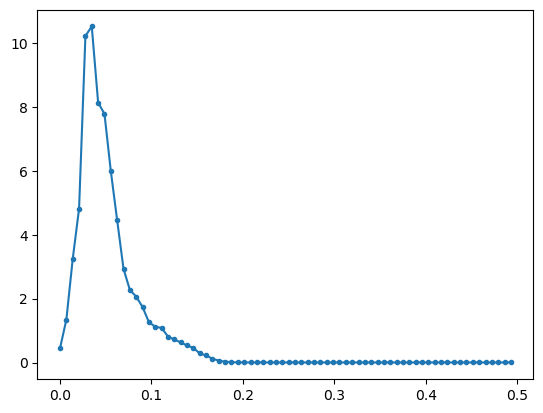

In [52]:
#aplicamos la transformada de Fourier a la componente eddy a lo largo del eje de longitudes (descomposición en números de onda zonal)
yf= fft(np.array(anomalia_temporal_v_50S),axis=1)
#definimos ahora el vector de número de onda correspondiente (desde 1 hasta nlon/2)
nlon= len(anomalia_temporal_v_50S.lon)
xf= fftfreq(nlon,1)[:(nlon)//2]
#promediamos para todos los tiempos
yfm=np.mean(np.abs(yf),axis=0)
plt.plot(xf,2/nlon*np.abs(yfm[:(nlon)//2]),marker='.')

#ahora le aplicamos un filtro pasa banda para quedarnos con las componentes con número de onda zonal entre 4 y 9
#ahora hacemos la transformada inversa

In [108]:
#filtramos yf para quedarnos solo con los números de onda zonales entre 4 y 9, esto es:
yf_filtrado = yf
yf_filtrado[:,0:4]=0
yf_filtrado[:,10:]=0

Text(0.5, 1.0, 'Diagrama de Hovmöller de la componente eddy transitoria a 300 [hPa] y a 50$^\\circ$S')

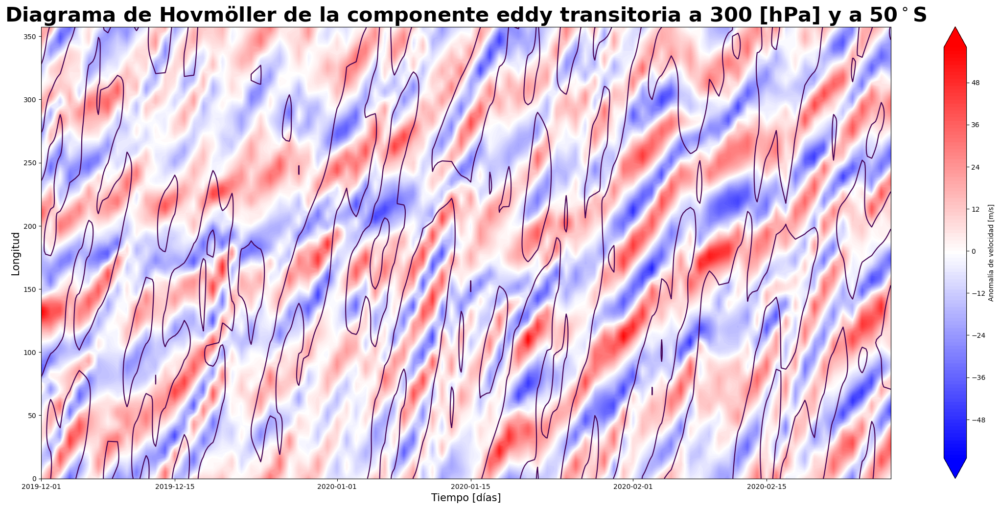

In [118]:
#ahora cogemos la señal filtrada y le aplicamos la transformada inversa para volver al dominio temporal
Vtg= 2*np.abs(ifft(yf_filtrado,axis=1))
#representamos de nuevo el hovmoller y representamos sobre el él los contornos de la señal transformada
anomalia_temporal_v_50S= anomalia_temporal_v.sel(lat=-50)
fig = plt.figure(figsize=(28,12)) 
ax = fig.add_subplot(1, 1, 1)
rango= np.max((np.abs(anomalia_temporal_v_50S.min()),np.abs(anomalia_temporal_v_50S.max())))
levels_hoevmoller= np.round(np.arange(-rango, +rango, 1),decimals=0)
im = ax.contourf(anomalia_temporal_v_50S.time,anomalia_temporal_v_50S.lon,np.transpose(np.array(anomalia_temporal_v_50S)),levels_hoevmoller,cmap='bwr',extend='both')
fig.colorbar(im,ax=ax, label='Anomalía de velocidad [m/s]') #Para la barra de colores
im2 = ax.contour(anomalia_temporal_v_50S.time,anomalia_temporal_v_50S.lon,np.transpose(Vtg),[20])
ax.set_xlabel('Tiempo [días]',fontsize=15)
ax.set_ylabel('Longitud',fontsize=15)
ax.set_title('Diagrama de Hovmöller de la componente eddy transitoria a 300 [hPa] y a 50$^\circ$S',fontsize=30,weight='bold')
#fig.savefig('Cambios temperatura del aire (Ta) del modelo CESM2-WACCM.png')

(c) Repetimos para la latitud de 45N

Text(0.5, 1.0, 'Diagrama de Hovmöller de la componente eddy transitoria a 300 [hPa] y a 45$^\\circ$N')

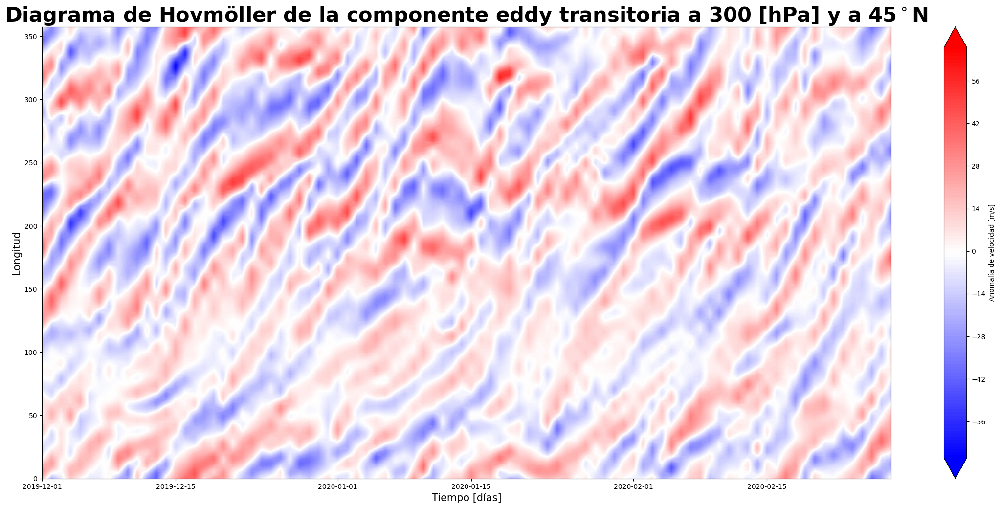

In [94]:
anomalia_temporal_v_45N= anomalia_temporal_v.sel(lat=45)
fig = plt.figure(figsize=(28,12)) 
ax = fig.add_subplot(1, 1, 1)
rango= np.max((np.abs(anomalia_temporal_v_45N.min()),np.abs(anomalia_temporal_v_45N.max())))
levels_hoevmoller= np.round(np.arange(-rango, +rango, 1),decimals=0)
im = ax.contourf(anomalia_temporal_v_45N.time,anomalia_temporal_v_45N.lon,np.transpose(np.array(anomalia_temporal_v_45N)),levels_hoevmoller,cmap='bwr',extend='both')
fig.colorbar(im,ax=ax, label='Anomalía de velocidad [m/s]') #Para la barra de colores
#ii = ax.contour(latT,lev/100,mediaTpast)
ax.set_xlabel('Tiempo [días]',fontsize=15)
ax.set_ylabel('Longitud',fontsize=15)
ax.set_title('Diagrama de Hovmöller de la componente eddy transitoria a 300 [hPa] y a 45$^\circ$N',fontsize=30,weight='bold')
#fig.savefig('Cambios temperatura del aire (Ta) del modelo CESM2-WACCM.png')

(d) Ahora representamos la amplitud del paquete de ondas en el mapa. Para ello tengo que calcular la envolvente para todas las latitudes.

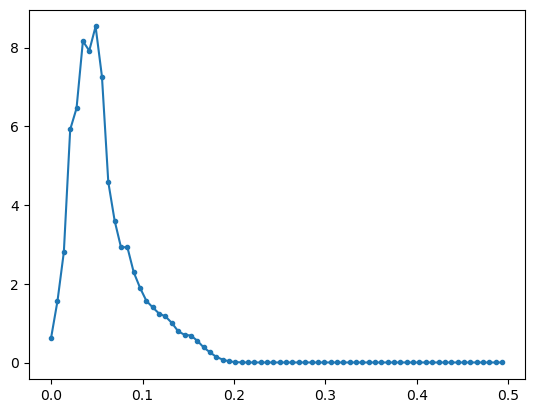

In [119]:
#aplicamos la transformada de Fourier a la componente eddy a lo largo del eje de longitudes (descomposición en números de onda zonal)
yf= fft(np.array(anomalia_temporal_v_45N),axis=1)
#definimos ahora el vector de número de onda correspondiente (desde 1 hasta nlon/2)
nlon= len(anomalia_temporal_v_45N.lon)
xf= fftfreq(nlon,1)[:(nlon)//2]
#promediamos para todos los tiempos
yfm=np.mean(np.abs(yf),axis=0)
plt.plot(xf,2/nlon*np.abs(yfm[:(nlon)//2]),marker='.')

#ahora le aplicamos un filtro pasa banda para quedarnos con las componentes con número de onda zonal entre 4 y 9
#ahora hacemos la transformada inversa

In [120]:
#filtramos yf para quedarnos solo con los números de onda zonales entre 4 y 9, esto es:
yf_filtrado = yf
yf_filtrado[:,0:4]=0
yf_filtrado[:,10:]=0

Text(0.5, 1.0, 'Diagrama de Hovmöller de la componente eddy transitoria a 300 [hPa] y a 45$^\\circ$N')

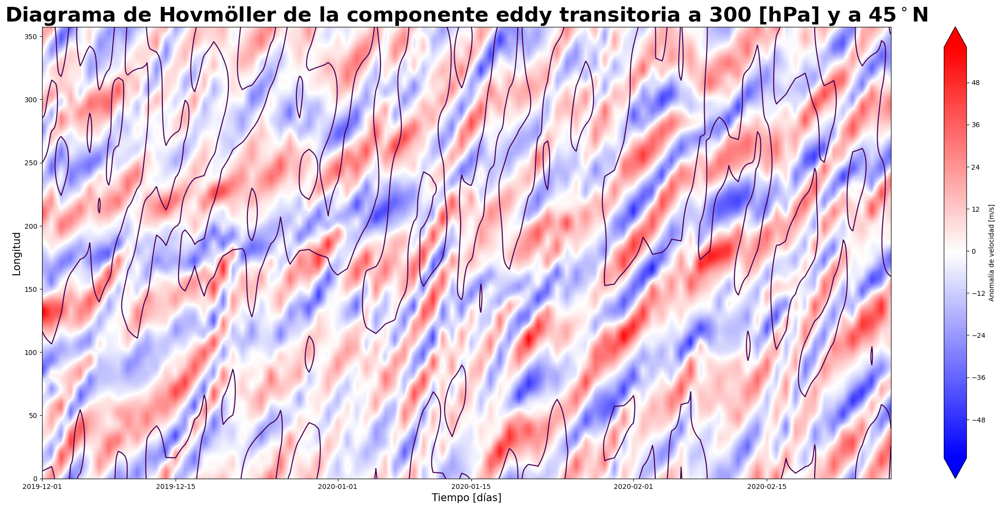

In [121]:
#ahora cogemos la señal filtrada y le aplicamos la transformada inversa para volver al dominio temporal
Vtg= 2*np.abs(ifft(yf_filtrado,axis=1))
#representamos de nuevo el hovmoller y representamos sobre el él los contornos de la señal transformada
anomalia_temporal_v_45N= anomalia_temporal_v.sel(lat=-50)
fig = plt.figure(figsize=(28,12)) 
ax = fig.add_subplot(1, 1, 1)
rango= np.max((np.abs(anomalia_temporal_v_45N.min()),np.abs(anomalia_temporal_v_45N.max())))
levels_hoevmoller= np.round(np.arange(-rango, +rango, 1),decimals=0)
im = ax.contourf(anomalia_temporal_v_45N.time,anomalia_temporal_v_45N.lon,np.transpose(np.array(anomalia_temporal_v_45N)),levels_hoevmoller,cmap='bwr',extend='both')
fig.colorbar(im,ax=ax, label='Anomalía de velocidad [m/s]') #Para la barra de colores
im2 = ax.contour(anomalia_temporal_v_45N.time,anomalia_temporal_v_45N.lon,np.transpose(Vtg),[20])
ax.set_xlabel('Tiempo [días]',fontsize=15)
ax.set_ylabel('Longitud',fontsize=15)
ax.set_title('Diagrama de Hovmöller de la componente eddy transitoria a 300 [hPa] y a 45$^\circ$N',fontsize=30,weight='bold')
#fig.savefig('Cambios temperatura del aire (Ta) del modelo CESM2-WACCM.png')

en el hovmoller,  pintar la envolvente de la amplitud de las ondas, podemos ver regiones. EL controno nos indica hacia donde se propaga la energía de la onda. Podemos ver si se despalza más rápido la envolvente o los máximos. Se ve que la velocidad de grupo SIEMPRE es mayor que la de fase (referencia a la ecuación, que es la velocidad de fase más un valor positivo), con lo cual esto es coherente con la teoría.
COmentar también que hay regiones que en las que hay más ondas que en otras